# 10. Figure 7

This notebook is used to create the panels of Figure 7.

Before starting, use 1.Preprocessing notebook to generate:
- SC3_normalized.h5ad - Normalized single-cell data

Before starting, use 10.Co-abundance analysis notebook to generate:
- SC3_co-abundance.csv

Download data available at Metabolights [www.ebi.ac.uk/metabolights/MTBLS11236], study identifier MTBLS11236 and move to data folder:
- SC3_metabolite_IDs.csv - Metabolite metadata

In [1]:
from pathlib import Path
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import pandas as pd
import scanpy as sc
from anndata import read_h5ad, concat
import outer_spacem as osm
import numpy as np
from scipy import stats
from joypy import joyplot
import re
import networkx as nx
from scipy.cluster.hierarchy import linkage, leaves_list
from scipy.spatial.distance import pdist

import sys
sys.path.insert(0, '../functions/')
import pl
import utils

### Set plot style

In [2]:
%matplotlib inline
%config InlineBackend.figure_formats=['retina']
sns.set(rc={'figure.figsize':(5, 5),
            'legend.frameon':False},
        style='ticks',
        context='talk')

# Render figures with higher resolution.
plt.rcParams['figure.dpi']=200
# Save with transparent regions white background.
plt.rcParams['savefig.facecolor']='white'

### Set color palette

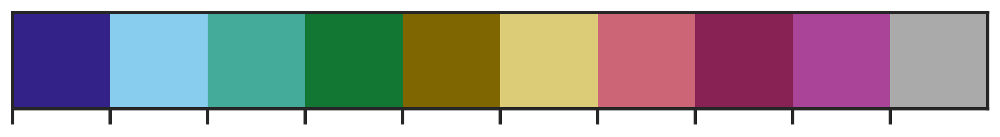

In [3]:
#color palette
palette = [(51,34,136),(136,204,238),(68,170,153),(17,119,51),(128,102,0),(221,204,119),(204,102,119),(136,34,85),(170,68,153),(170,170,170)]
palette = [(e[0]/255.0, e[1]/255.0, e[2]/255.0) for e in palette]
cmap = ListedColormap(palette)
sns.color_palette(palette=None,as_cmap=True)
sns.palplot(palette)

## Panel B, Panel C and Panel G

### Set paths

In [12]:
#input
data_dir = Path(r'../data')
anndata_path = data_dir / 'SC3_normalized.h5ad'
metabolite_path = data_dir / 'SC3_metabolite_IDs.csv'

#output
plots_path =  Path(r'../') / 'figures' / 'figure_7'
plots_path.mkdir(parents=True, exist_ok=True)
sc.settings.figdir = plots_path

### Load data

In [13]:
#load anndata file
adata =  sc.read_h5ad(anndata_path)
adata.raw = adata

In [14]:
metabolite_ID = pd.read_csv(metabolite_path)

In [15]:
sc.pp.pca(adata)
sc.external.pp.bbknn(adata, batch_key='well')
sc.tl.umap(adata, random_state=12345) 
adata.obs[['UMAP1', 'UMAP2']] = adata.obsm['X_umap']

### Panel B - Conditions

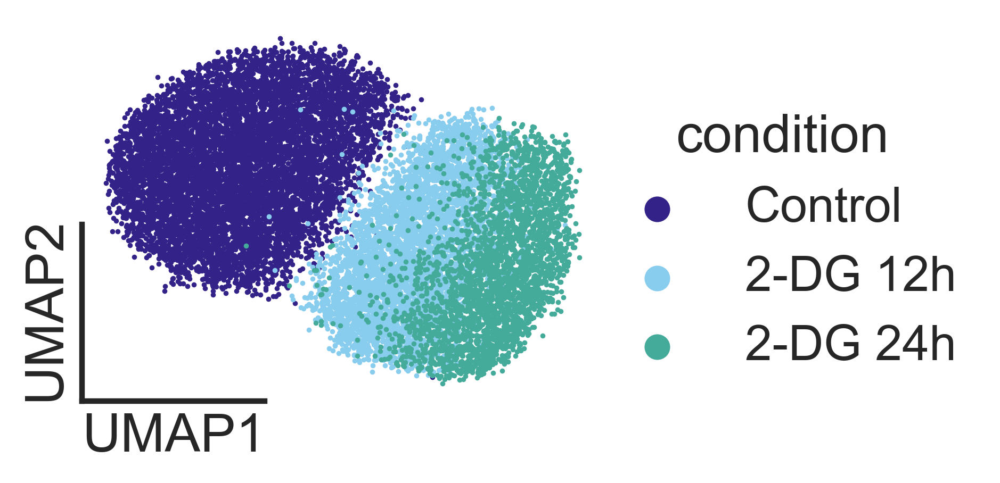

In [17]:
custom_order = ['Control', '2-DG 12h', '2-DG 24h']
adata.obs['condition'] = adata.obs['condition'].astype('category')
adata.obs['condition'] = pd.Categorical(adata.obs['condition'], categories=custom_order, ordered=True)

f = pl.highlight_scatterplot(
    data=adata,
    obsm_key='X_umap',
    hue='condition', 
    palette=palette,
    height=3,
    aspect=1.4,
    decorate_titles=False,
    trim_axes=True,
    scatter_kwargs={'s':3})

f.add_legend(markerscale=5)
f.set_titles(col_template='')

plt.xlabel('UMAP1', loc='left', fontsize=18)
plt.ylabel('UMAP2', loc='bottom', fontsize=18)

plt.savefig(plots_path / 'panel_B.png', bbox_inches='tight')
plt.savefig(plots_path / 'panel_B.svg', bbox_inches='tight')

### Panel C - Glycolysis markers

In [18]:
#referemces for differential analysis
reference = 'rest'
column = 'condition2'

#compute wilcoxon-rank-sum test results
sc.tl.rank_genes_groups(adata, groupby=column, method='wilcoxon', use_raw=False, reference=reference, pts=True)

#compile differential analysis results
DA = utils.compile_differential_analysis(adata, column, reference)
DA_markers = DA.merge(metabolite_ID, on='ion', how='inner')

#Save all differentially expressed markers for Control vs 2DG
DA_markers.to_csv(data_dir / 'SC3_DA_condition.csv')

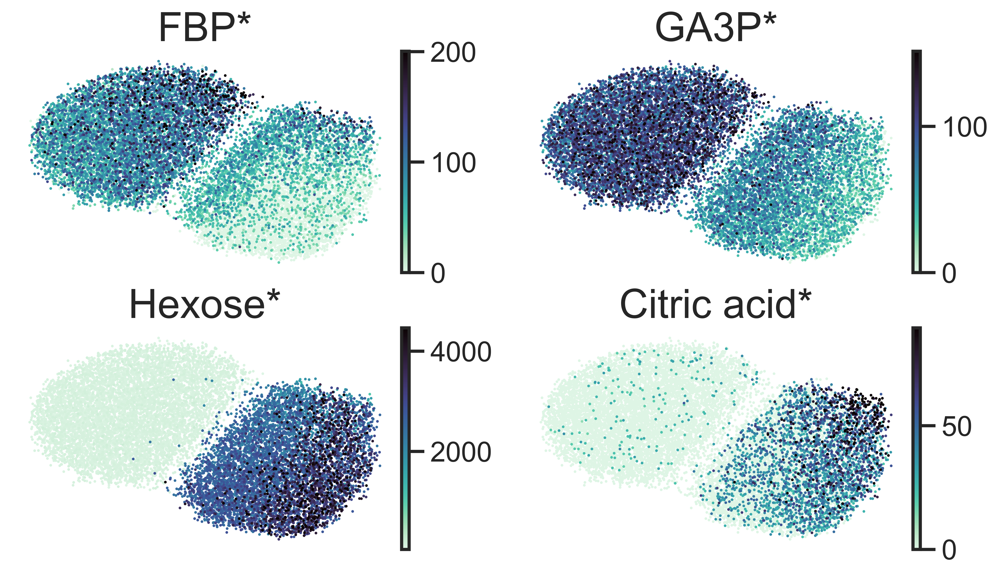

In [19]:
lower, upper = np.quantile(adata.layers['norm_counts'], [0.01, 0.99], axis=0)
adata.layers['clipped'] = np.clip(adata.layers['norm_counts'], lower, upper)

#Glycolysis markers
glycolysis = ['C6H14O12P2-H', 'C3H7O6P-H','C6H12O6-H', 'C6H8O7-H']

with plt.rc_context({'figure.figsize':(4, 2.5),  'figure.dpi':(300), 'axes.titlesize':24, 'legend.fontsize':22}):
    f = sc.pl.umap(adata,
                   color= glycolysis,
                   cmap='mako_r',
                   s=10,
                   layer='clipped',
                   frameon=False,
                   ncols=2,
                   title=['FBP*', 'GA3P*', 'Hexose*','Citric acid*'],
                   show=True,
                   return_fig=True)
    plt.savefig(plots_path / 'panel_C.png', bbox_inches='tight')
    plt.savefig(plots_path / 'panel_C.svg', bbox_inches='tight')

## Panel D and Supplementary Figure 5 Panel D

### Set paths

In [20]:
input
data_dir = Path(r'../data')
data_path = data_dir / 'SC3_co-abundance.csv'
metabolite_path = data_dir / 'SC3_metabolite_IDs.csv'

#output
plots_path1 =  Path(r'../') / 'figures' / 'figure_7'
plots_path1.mkdir(parents=True, exist_ok=True)

plots_path2 =  Path(r'../') / 'figures' / 'supplementary_figure_5'
plots_path2.mkdir(parents=True, exist_ok=True)

sc.settings.figdir = plots_path1

### Load data

In [21]:
##load data file
coabundance_df =  pd.read_csv(data_path)

#load metabolites file
metabolite_ID = pd.read_csv(metabolite_path)

### Networks
#### 12h

/var/folders/yd/30x9k4ks4xgcqd7x9_jk19c40000gn/T/ipykernel_34561/1906746260.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  ec = nx.draw_networkx_edges(G, pos, alpha=0.8, edge_cmap=plt.cm.get_cmap('Greys'), edge_color=edges_color, edge_vmin=0, edge_vmax=0.9)


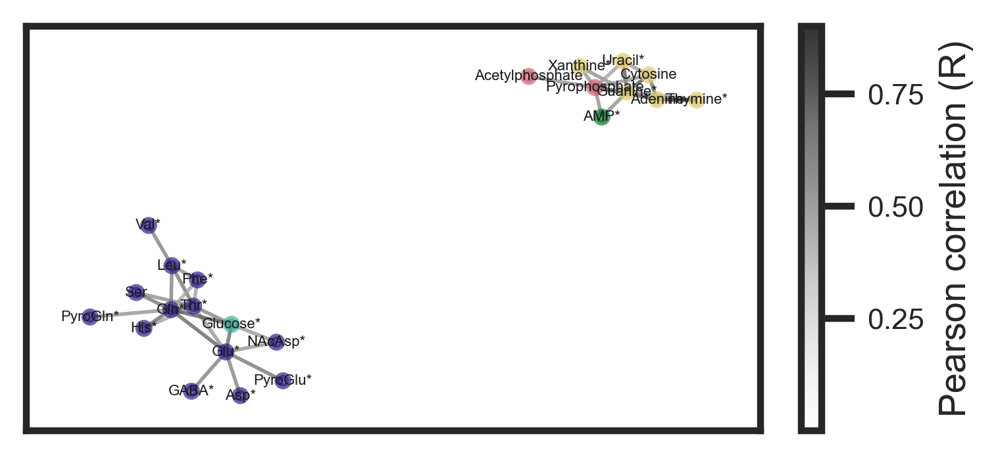

<Figure size 1000x1000 with 0 Axes>

In [22]:
corr_filt = coabundance_df.loc[(coabundance_df['cell_line']=='2-DG 12h') &
                               (coabundance_df['corr']>= 0.4)]

corr_colors = {'nodes': {}, 'edges': {}, 'width': {}}

for index, row in corr_filt.iterrows():
    if row['col1'] not in corr_colors['nodes']: 
        corr_colors['nodes'][row['col1']] = utils.get_color_by_class(metabolite_ID.loc[metabolite_ID.ion==row['col1'],
                                                                     'class'].values[0])
    if row['col2'] not in corr_colors['nodes']: 
        corr_colors['nodes'][row['col2']] = utils.get_color_by_class(metabolite_ID.loc[metabolite_ID.ion==row['col2'],
                                                                     'class'].values[0])
    edge = tuple(sorted([row['col1'], row['col2']]))
    if edge not in corr_colors['edges']:
        corr_colors['edges'][edge] = row['corr']

ion_to_label = metabolite_ID.set_index('ion')['metabolites'].to_dict()

plt.figure(figsize=(4, 2))
G = nx.from_pandas_edgelist(corr_filt, source='col1', target='col2')
nodes_color = [corr_colors['nodes'][n] for n in list(G.nodes)]
edges_color = [corr_colors['edges'][tuple(sorted(n))] for n in list(G.edges)]
pos = nx.spring_layout(G, seed = 2)
ec = nx.draw_networkx_edges(G, pos, alpha=0.8, edge_cmap=plt.cm.get_cmap('Greys'), edge_color=edges_color, edge_vmin=0, edge_vmax=0.9)
nc = nx.draw_networkx_nodes(G, pos, alpha=0.7, node_size=10, node_color=nodes_color)
cbar = plt.colorbar(ec, fraction=0.05, aspect=20, shrink=1, ticks=[0.25,0.5,0.75,1.0], label='Pearson correlation (R)')
cbar.ax.tick_params(labelsize=8)  # e.g., 8pt
cbar.set_label('Pearson correlation (R)', fontsize=10)
node_labels = {node: ion_to_label.get(node, node) for node in G.nodes}
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=4)
plt.show()

plt.savefig(plots_path1 / 'panel_D_12h.png', bbox_inches='tight')
plt.savefig(plots_path1 / 'panel_D_12h.svg', bbox_inches='tight')

#### 24h

/var/folders/yd/30x9k4ks4xgcqd7x9_jk19c40000gn/T/ipykernel_34561/730398933.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  ec = nx.draw_networkx_edges(G, pos, alpha=0.8, edge_cmap=plt.cm.get_cmap('Greys'), edge_color=edges_color, edge_vmin=0, edge_vmax=0.9)


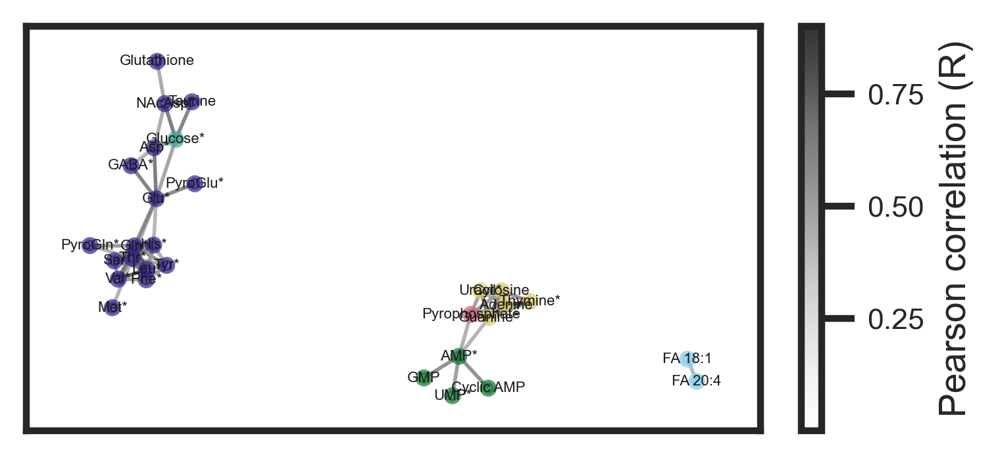

In [23]:
corr_filt = coabundance_df.loc[(coabundance_df['cell_line']=='2-DG 24h') &
                               (coabundance_df['corr']>= 0.4)]

corr_colors = {'nodes': {}, 'edges': {}, 'width': {}}

for index, row in corr_filt.iterrows():
    if row['col1'] not in corr_colors['nodes']: 
        corr_colors['nodes'][row['col1']] = utils.get_color_by_class(metabolite_ID.loc[metabolite_ID.ion==row['col1'],
                                                                     'class'].values[0])
    if row['col2'] not in corr_colors['nodes']: 
        corr_colors['nodes'][row['col2']] = utils.get_color_by_class(metabolite_ID.loc[metabolite_ID.ion==row['col2'],
                                                                     'class'].values[0])
    edge = tuple(sorted([row['col1'], row['col2']]))
    if edge not in corr_colors['edges']:
        corr_colors['edges'][edge] = row['corr']

ion_to_label = metabolite_ID.set_index('ion')['metabolites'].to_dict()

plt.figure(figsize=(4, 2))
G = nx.from_pandas_edgelist(corr_filt, source='col1', target='col2')
nodes_color = [corr_colors['nodes'][n] for n in list(G.nodes)]
edges_color = [corr_colors['edges'][tuple(sorted(n))] for n in list(G.edges)]
pos = nx.spring_layout(G, seed = 2)
ec = nx.draw_networkx_edges(G, pos, alpha=0.8, edge_cmap=plt.cm.get_cmap('Greys'), edge_color=edges_color, edge_vmin=0, edge_vmax=0.9)
nc = nx.draw_networkx_nodes(G, pos, alpha=0.7, node_size=10, node_color=nodes_color)
cbar = plt.colorbar(ec, fraction=0.05, aspect=20, shrink=1, ticks=[0.25,0.5,0.75,1.0], label='Pearson correlation (R)')
cbar.ax.tick_params(labelsize=8)  # e.g., 8pt
cbar.set_label('Pearson correlation (R)', fontsize=10)
node_labels = {node: ion_to_label.get(node, node) for node in G.nodes}
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=4)

plt.savefig(plots_path1 / 'panel_D_24h.png', bbox_inches='tight')
plt.savefig(plots_path1 / 'panel_D_24h.svg', bbox_inches='tight')

#### Control

/var/folders/yd/30x9k4ks4xgcqd7x9_jk19c40000gn/T/ipykernel_34561/3227552120.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  ec = nx.draw_networkx_edges(G, pos, alpha=0.8, edge_cmap=plt.cm.get_cmap('Greys'), edge_color=edges_color, edge_vmin=0, edge_vmax=0.9)


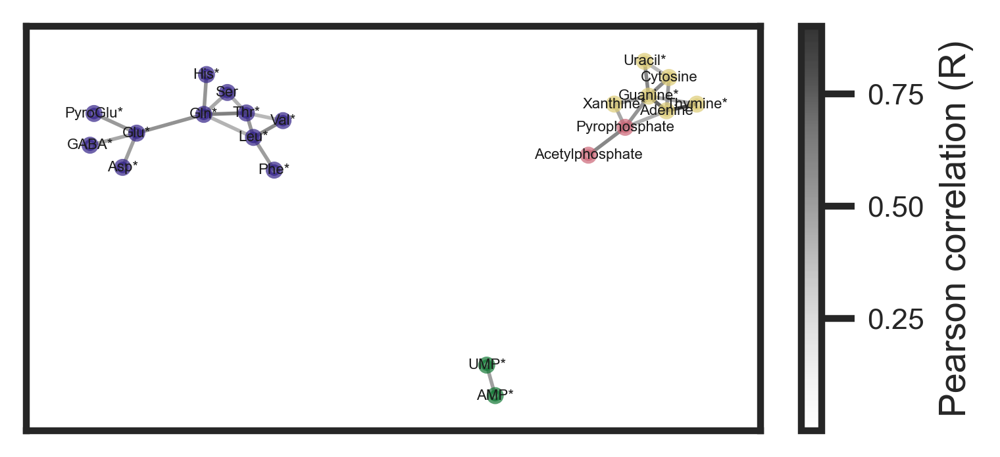

In [24]:
corr_filt = coabundance_df.loc[(coabundance_df['cell_line']=='Control') &
                               (coabundance_df['corr']>= 0.4)]

corr_colors = {'nodes': {}, 'edges': {}, 'width': {}}

for index, row in corr_filt.iterrows():
    if row['col1'] not in corr_colors['nodes']: 
        corr_colors['nodes'][row['col1']] = utils.get_color_by_class(metabolite_ID.loc[metabolite_ID.ion==row['col1'],
                                                                     'class'].values[0])
    if row['col2'] not in corr_colors['nodes']: 
        corr_colors['nodes'][row['col2']] = utils.get_color_by_class(metabolite_ID.loc[metabolite_ID.ion==row['col2'],
                                                                     'class'].values[0])
    edge = tuple(sorted([row['col1'], row['col2']]))
    if edge not in corr_colors['edges']:
        corr_colors['edges'][edge] = row['corr']

ion_to_label = metabolite_ID.set_index('ion')['metabolites'].to_dict()

plt.figure(figsize=(4, 2))
G = nx.from_pandas_edgelist(corr_filt, source='col1', target='col2')
nodes_color = [corr_colors['nodes'][n] for n in list(G.nodes)]
edges_color = [corr_colors['edges'][tuple(sorted(n))] for n in list(G.edges)]
pos = nx.spring_layout(G, seed = 2)
ec = nx.draw_networkx_edges(G, pos, alpha=0.8, edge_cmap=plt.cm.get_cmap('Greys'), edge_color=edges_color, edge_vmin=0, edge_vmax=0.9)
nc = nx.draw_networkx_nodes(G, pos, alpha=0.7, node_size=10, node_color=nodes_color)
cbar = plt.colorbar(ec, fraction=0.05, aspect=20, shrink=1, ticks=[0.25,0.5,0.75,1.0], label='Pearson correlation (R)')
cbar.ax.tick_params(labelsize=8)  
cbar.set_label('Pearson correlation (R)', fontsize=10)
node_labels = {node: ion_to_label.get(node, node) for node in G.nodes}
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=4)

plt.savefig(plots_path2 / 'panel_D_Control.png', bbox_inches='tight')
plt.savefig(plots_path2 / 'panel_D_Control.svg', bbox_inches='tight')

## Panel E

### Set paths

In [25]:
#input
data_dir = Path(r'../data')
anndata_path = data_dir / 'SC3_normalized.h5ad'

#output
plots_path =  Path(r'../') / 'figures' / 'figure_7'
plots_path.mkdir(parents=True, exist_ok=True)
sc.settings.figdir = plots_path

### Load data

In [26]:
#load anndata file
adata =  sc.read_h5ad(anndata_path)
adata.raw = adata

### Scatterplots

In [27]:
adata.obs.index = adata.obs.index.astype(str) + '_' + adata.obs['condition'].astype(str) + '_' + adata.obs['well'].astype(str)
adata.obs.index.name = 'cell_id'

int_matrix = pd.DataFrame(columns=adata.var_names, data=adata.X, index=adata.obs_names).reset_index()
int_matrix[['condition', 'well']] = int_matrix['cell_id'].str.extract(
    r'^[\w\-]+_([\w\s\-]+)_([\w\d]+)$')

In [28]:
def scatterplot_correlation(data, X, Y, color, column, observation=None, X_name=None, Y_name=None, filename=None, title=None):
    corr_vals = []
    pvals = []

    if observation is None:
        subset = data
    else:
        subset = data[data[column] == observation]    
    
    for _, group in subset.groupby("well"):
        if group[[X, Y]].dropna().shape[0] >= 2:  # Enough data points
            try:
                res = stats.pearsonr(group[X], group[Y])
                corr_vals.append(res.statistic)
                pvals.append(res.pvalue)
            except Exception:
                continue
    
    # Mean of well-level correlations
    if corr_vals:
        mean_r = np.mean(corr_vals)
        mean_p = np.mean(pvals)
    else:
        mean_r = float("nan")
        mean_p = float("nan")
    
    # Add regression line (over all data in the condition)
    plt.figure(figsize=(4, 4))
    ax=sns.regplot(data=subset,
                x=X,
                y=Y,
                #ax=ax,
                scatter=True,
                color=color,
                ci=95,
                line_kws={'lw': 2, 'color': 'black'},
                scatter_kws={'s': 40,
                             'edgecolor': 'white',
                             'alpha': 1.0},
                truncate=False)
    
    ax.grid(False)
    ax.minorticks_off()
    ax.text(0.05, 0.95,
                f'R: {mean_r:.3f}',
                transform=ax.transAxes,
                fontsize=22,
                verticalalignment='top',
                bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.7))
    
    plt.xlabel(xlabel=X_name, fontsize=24)
    plt.ylabel(ylabel=Y_name, fontsize=24)
    plt.tick_params(axis='both', which='minor', labelsize=18)
    if title:
        ax.set_title(title, fontsize=24)
    if filename:
        plt.savefig(plots_path/f'{filename}_{observation}_{X}_{Y}.svg', dpi=300, bbox_inches='tight')
        plt.savefig(plots_path/f'{filename}_{observation}_{X}_{Y}.png', dpi=300, bbox_inches='tight')
    plt.show()
    

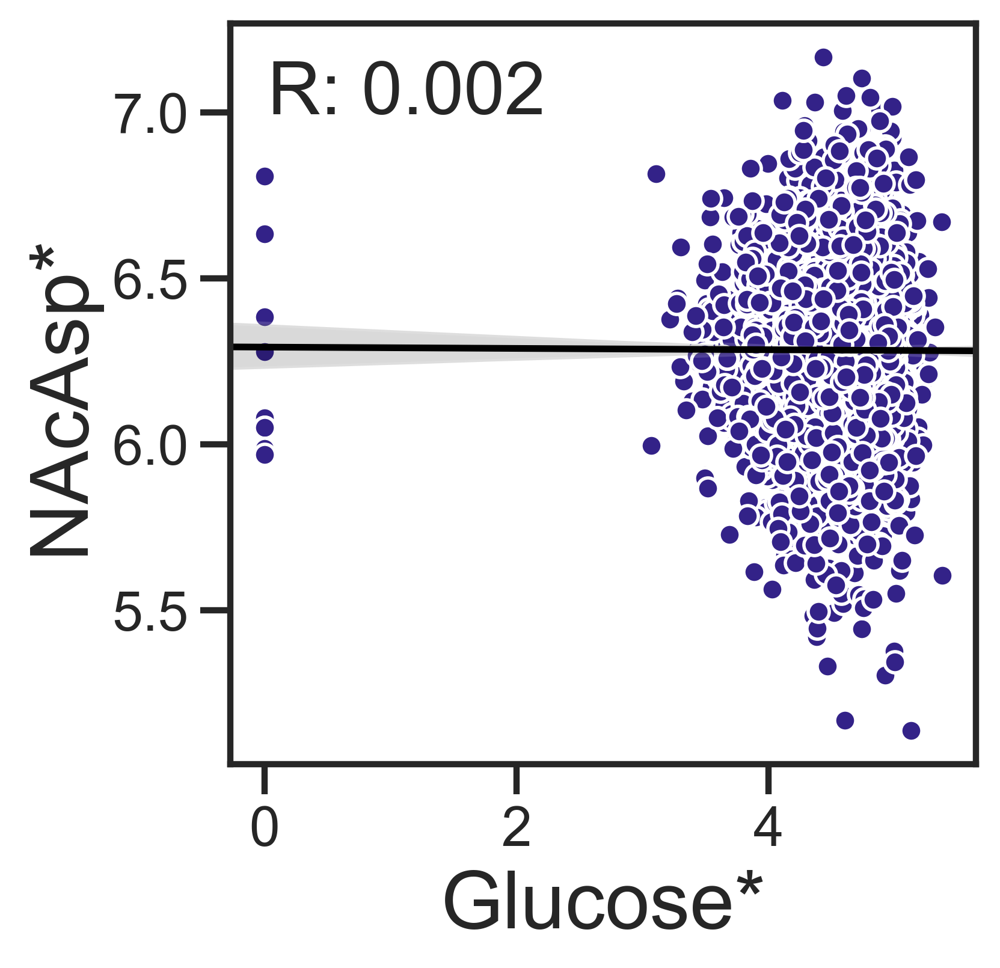

In [29]:
scatterplot_correlation(data=int_matrix, X='C6H12O6-H', Y='C6H9NO5-H', color=palette[0], observation='Control',
                           column='condition', X_name= 'Glucose*', Y_name='NAcAsp*',filename= 'panel_E')

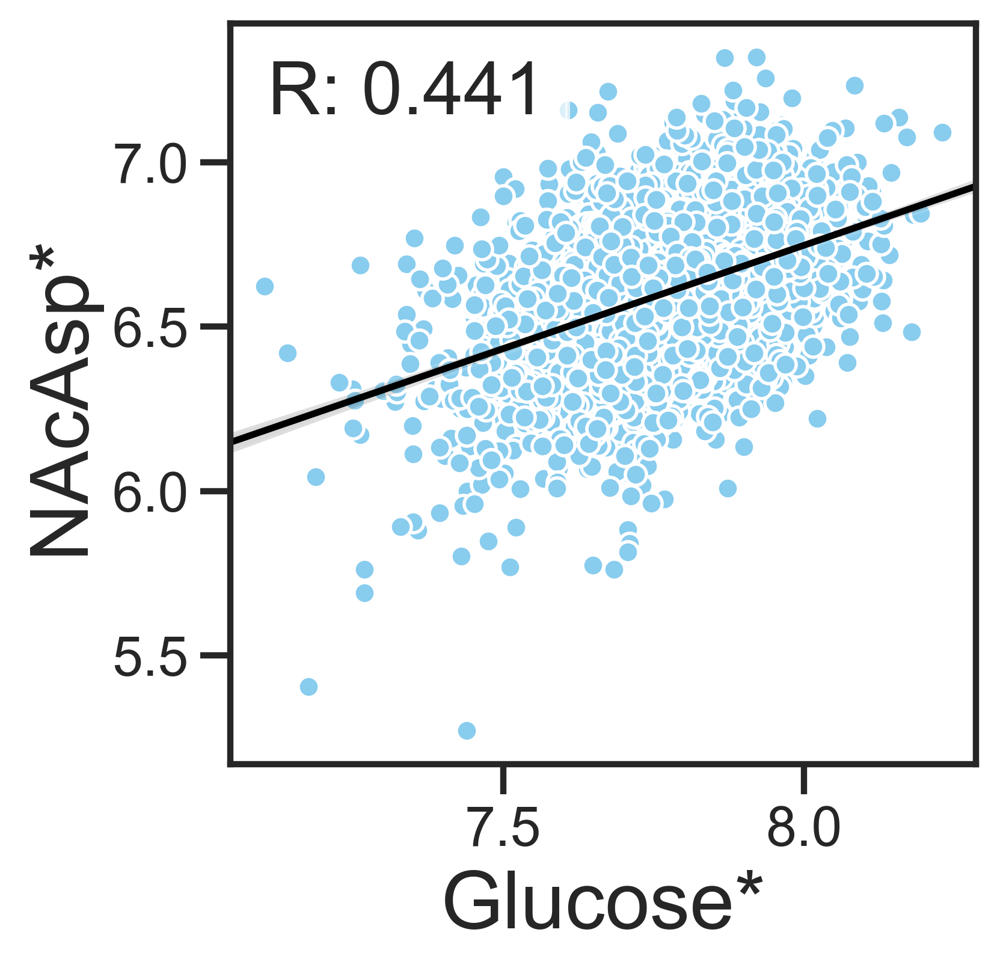

In [30]:
scatterplot_correlation(data=int_matrix, X='C6H12O6-H', Y='C6H9NO5-H', color=palette[1], observation='2-DG 12h',
                           column='condition', X_name= 'Glucose*', Y_name='NAcAsp*',filename= 'panel_E')

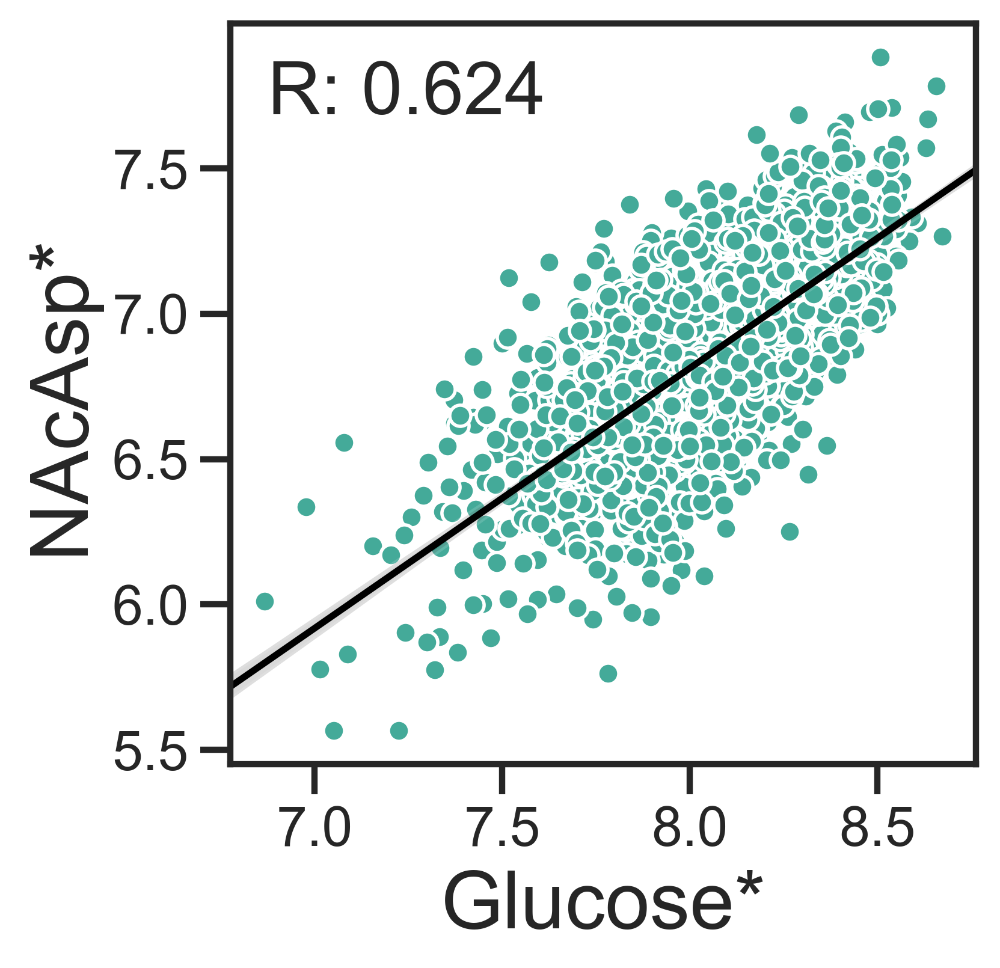

In [31]:
scatterplot_correlation(data=int_matrix, X='C6H12O6-H', Y='C6H9NO5-H', color=palette[2], observation='2-DG 24h',
                           column='condition', X_name= 'Glucose*', Y_name='NAcAsp*',filename= 'panel_E')

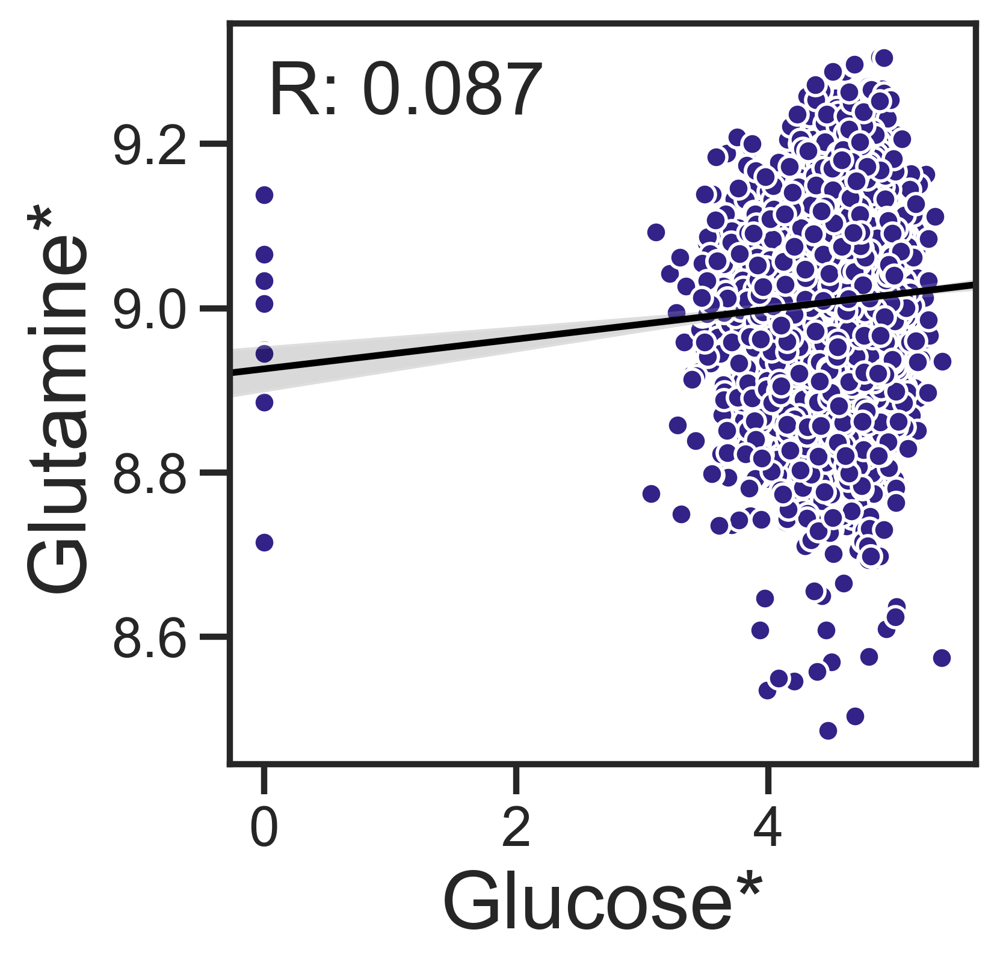

In [32]:
scatterplot_correlation(data=int_matrix, X='C6H12O6-H', Y='C5H10N2O3-H', color=palette[0], observation='Control',
                           column='condition', X_name= 'Glucose*', Y_name='Glutamine*',filename= 'panel_E')

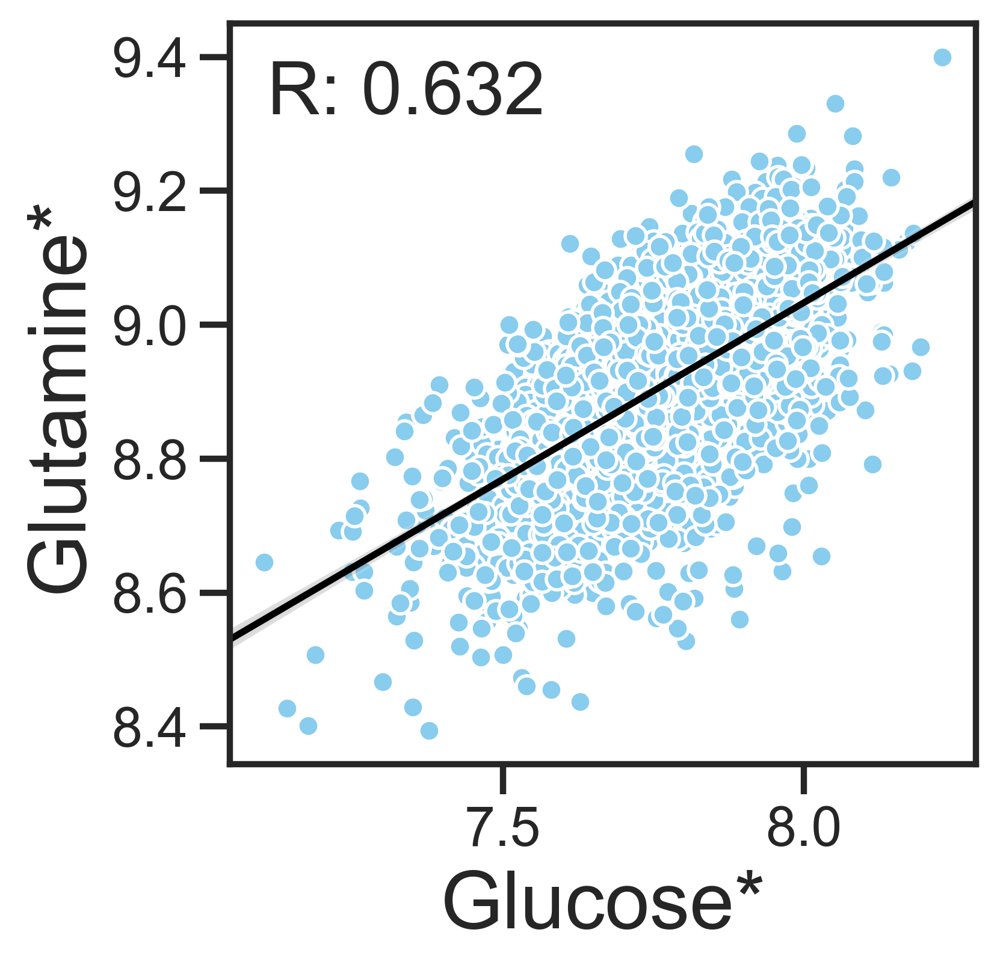

In [33]:
scatterplot_correlation(data=int_matrix, X='C6H12O6-H', Y='C5H10N2O3-H', color=palette[1], observation='2-DG 12h',
                           column='condition', X_name= 'Glucose*', Y_name='Glutamine*',filename= 'panel_E')

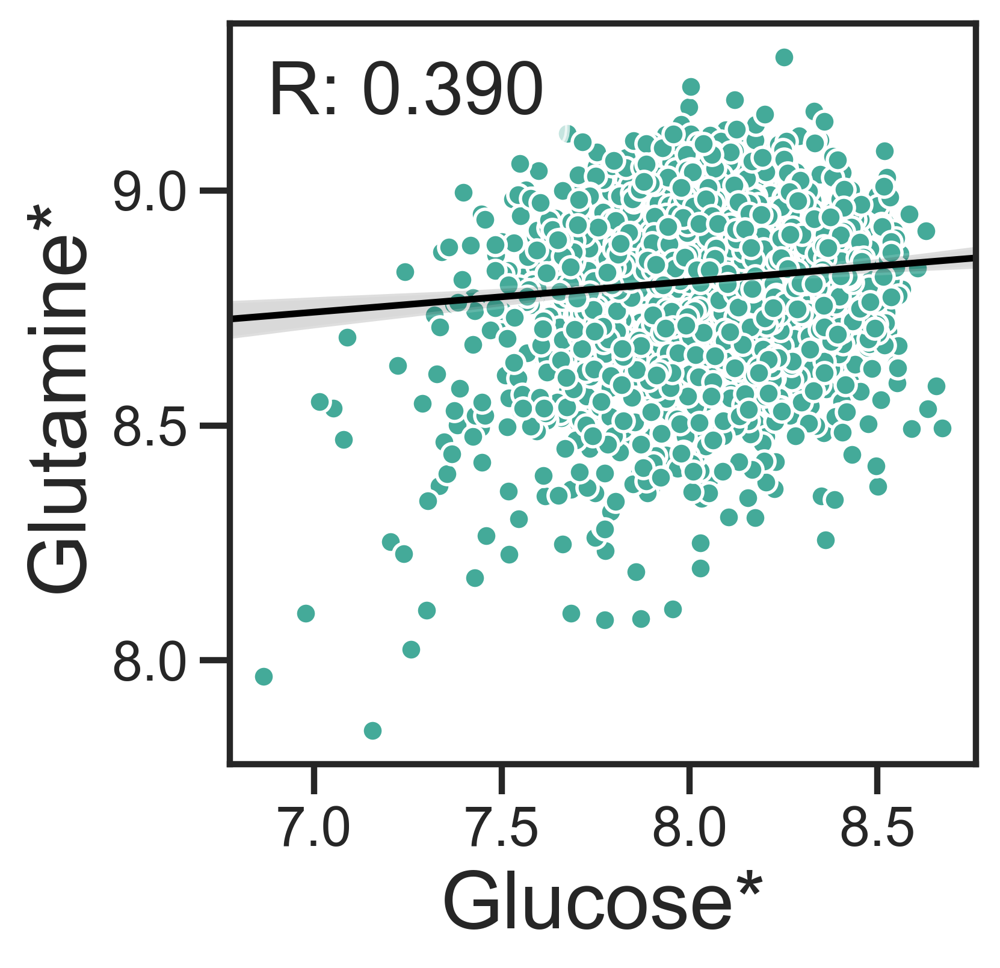

In [34]:
scatterplot_correlation(data=int_matrix, X='C6H12O6-H', Y='C5H10N2O3-H', color=palette[2], observation='2-DG 24h',
                           column='condition', X_name= 'Glucose*', Y_name='Glutamine*',filename= 'panel_E')

## Panel F and Panel G

### Set paths

In [35]:
#input
data_dir = Path(r'../data')
anndata_path = data_dir / 'SC3_normalized.h5ad'
metabolite_path = data_dir / 'SC3_metabolite_IDs.csv'

#output
plots_path =  Path(r'../') / 'figures' / 'figure_7'
plots_path.mkdir(parents=True, exist_ok=True)
sc.settings.figdir = plots_path

### Load data

In [36]:
#load anndata file
adata =  sc.read_h5ad(anndata_path)
adata.raw = adata

#load metabolite IDs
metabolite_ID = pd.read_csv(metabolite_path)

In [37]:
sc.pp.pca(adata)
sc.external.pp.bbknn(adata, batch_key='well')
sc.tl.umap(adata, random_state=12345) 
adata.obs[['UMAP1', 'UMAP2']] = adata.obsm['X_umap']

In [38]:
# clustering with leiden
sc.tl.leiden(adata, resolution=0.7, flavor='leidenalg')

/var/folders/yd/30x9k4ks4xgcqd7x9_jk19c40000gn/T/ipykernel_34561/3895726311.py:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=0.7, flavor='leidenalg')


### Panel F - UMAP and barplot

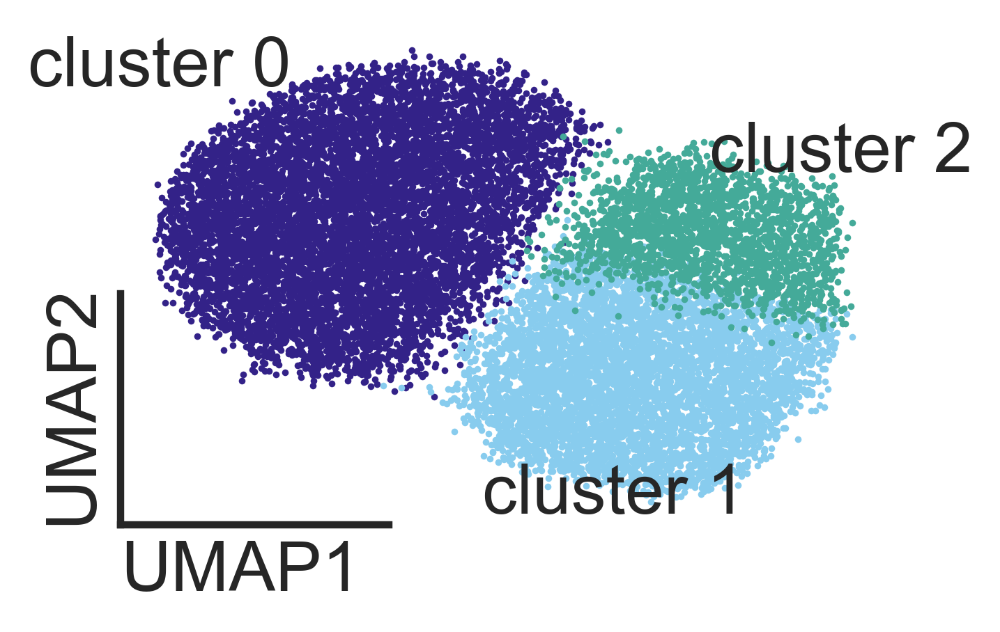

In [39]:
f = pl.highlight_scatterplot(
    data=adata,
    obsm_key='X_umap',
    hue='leiden', 
    palette=palette,
    height=3,
    aspect=1.4,
    decorate_titles=False,
    trim_axes=True,
    scatter_kwargs={'s':3})

#f.add_legend(markerscale=5)
f.set_titles(col_template='')
plt.xlabel('UMAP1', loc='left', fontsize=18)
plt.ylabel('UMAP2', loc='bottom', fontsize=18)

plt.text(x=-6, y=4.5, s='cluster 0', size=18)
plt.text(x=0, y=-3, s='cluster 1', size=18)
plt.text(x=3, y=3, s='cluster 2', size=18)

plt.savefig(plots_path / 'panel_F_UMAP.png', bbox_inches='tight')
plt.savefig(plots_path / 'panel_F_UMAP.svg', bbox_inches='tight')

/Users/jeanydelafiori/Apps/outer-spacem/outer_spacem/tl/_tl.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  comps = adata.obs.groupby(key_split)[key_count].value_counts(normalize=True)


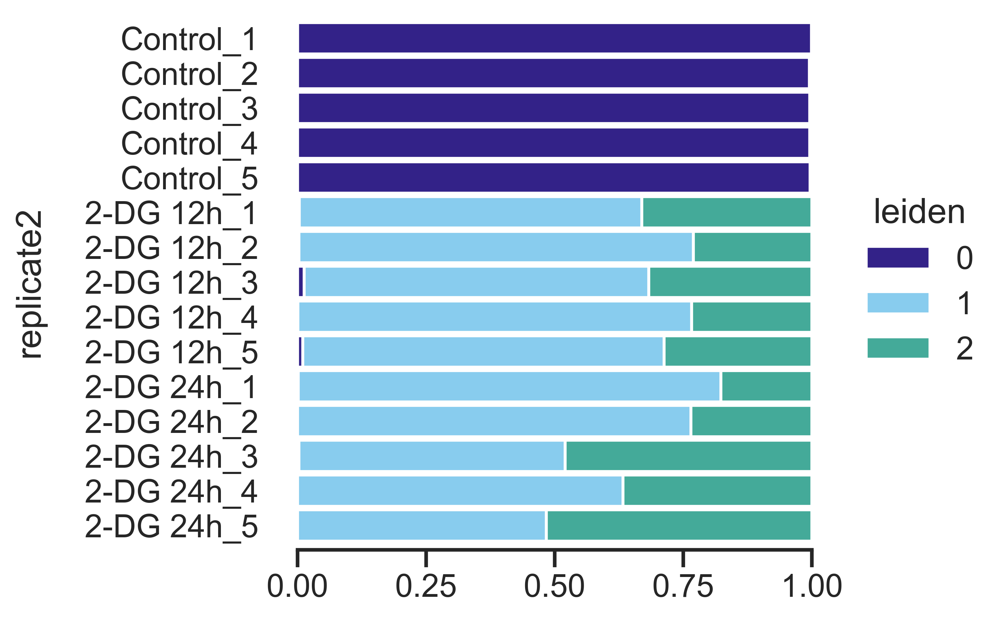

In [40]:
custom_order = ['2-DG 24h_5','2-DG 24h_4','2-DG 24h_3','2-DG 24h_2', '2-DG 24h_1',
                '2-DG 12h_5','2-DG 12h_4','2-DG 12h_3','2-DG 12h_2', '2-DG 12h_1',
                'Control_5','Control_4','Control_3','Control_2', 'Control_1',]

adata.obs['replicate2'] = adata.obs['replicate2'].astype('category')
adata.obs['replicate2'] = pd.Categorical(adata.obs['replicate2'], categories=custom_order, ordered=True)

g = osm.pl.cross_label_counts_stacked(
    adata, 
    key_split="replicate2", 
    key_count="leiden", 
    palette=palette,
    normalize="relative",
    decorate_yticks=False
)
g.grid(False)
plt.savefig(plots_path / 'panel_F_barplot.png', bbox_inches='tight')
plt.savefig(plots_path / 'panel_F_barplot.svg', bbox_inches='tight')

### Panel G - UMAP and violin plot

In [41]:
adata2 = adata[adata.obs['leiden'] != '0', :]

#referemces for differential analysis
reference = 'rest'
column = 'leiden'

#compute wilcoxon-rank-sum test results
sc.tl.rank_genes_groups(adata2, groupby=column, method='wilcoxon', use_raw=False, reference=reference, pts=True)

#compile differential analysis results
DA = utils.compile_differential_analysis(adata2, column, reference)
DA_markers = DA.merge(metabolite_ID, on='ion', how='inner')

DA_markers.to_csv(data_dir/'SC3_DA_clustering.csv')

/Users/jeanydelafiori/Apps/miniconda3/envs/spacem_analysis/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:645: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


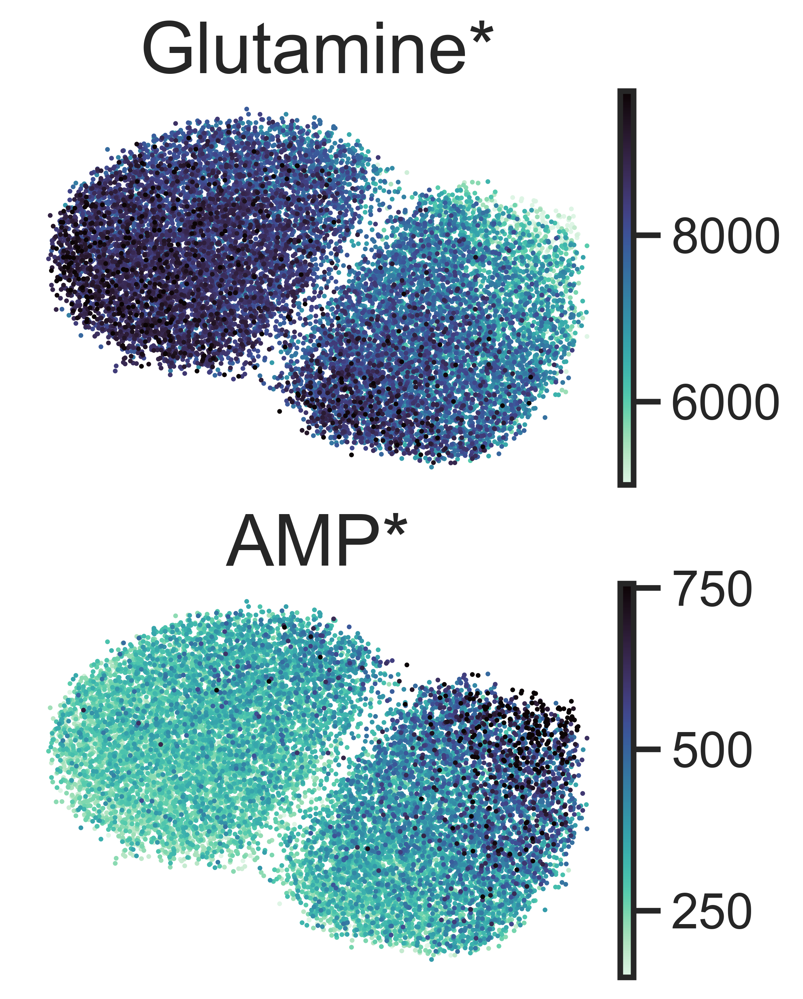

In [42]:
lower, upper = np.quantile(adata.layers['norm_counts'], [0.01, 0.99], axis=0)
adata.layers['clipped'] = np.clip(adata.layers['norm_counts'], lower, upper)

#top ranked markers - clusters 1 and 2
clustering = ['C5H10N2O3-H', 'C10H14N5O7P-H']

with plt.rc_context({'figure.figsize':(3, 2.5),  'figure.dpi':(300), 'axes.titlesize':24, 'legend.fontsize':22}):
    f = sc.pl.umap(adata,
                   color= clustering,
                   cmap='mako_r',
                   s=10,
                   layer='clipped',
                   frameon=False,
                   ncols=1,
                   title=['Glutamine*', 'AMP*'],
                   show=True,
                   return_fig=True)
    plt.savefig(plots_path / 'panel_G_UMAP.png', bbox_inches='tight')
    plt.savefig(plots_path / 'panel_G_UMAP.svg', bbox_inches='tight')

/var/folders/yd/30x9k4ks4xgcqd7x9_jk19c40000gn/T/ipykernel_34561/3456442772.py:18: UserWarning: 
The palette list has fewer values (2) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.violinplot(x=conds, y=data, palette=palette[1:3], ax=ax, order=custom_order,hue=conds)
/var/folders/yd/30x9k4ks4xgcqd7x9_jk19c40000gn/T/ipykernel_34561/3456442772.py:18: UserWarning: 
The palette list has fewer values (2) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.violinplot(x=conds, y=data, palette=palette[1:3], ax=ax, order=custom_order,hue=conds)


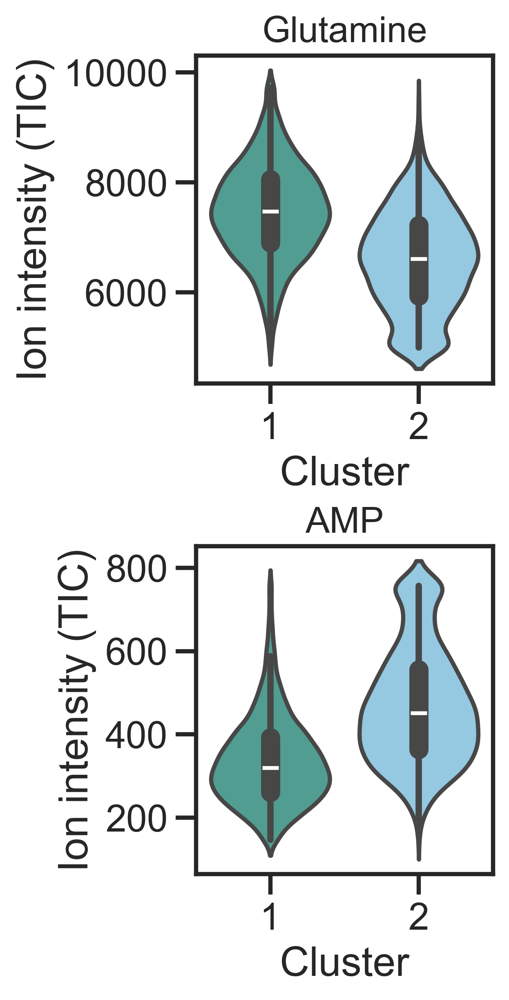

In [43]:
custom_order = ['1', '2']
lower, upper = np.quantile(adata2.layers['norm_counts'], [0.01, 0.99], axis=0)
adata2.layers['clipped'] = np.clip(adata2.layers['norm_counts'], lower, upper)

ions = ['C5H10N2O3-H', 'C10H14N5O7P-H']
ion_name_map = {'C5H10N2O3-H': 'Glutamine','C10H14N5O7P-H': 'AMP'}
    
# Setup grid: 5 rows × 4 columns
fig, axes = plt.subplots(2, 1, figsize=(3, 6), constrained_layout=True)
axes = axes.flatten()

for i, ion in enumerate(ions):
     ax = axes[i]
     data = adata.to_df(layer='clipped')[ion]
     conds = adata.obs['leiden']

        # Seaborn violin plot
     sns.violinplot(x=conds, y=data, palette=palette[1:3], ax=ax, order=custom_order,hue=conds)
     ion_display_name = ion_name_map.get(ion, ion)  # fallback to original name if not found
     ax.set_title(ion_display_name, fontsize=16)
     ax.set_xlabel("Cluster")
     ax.set_ylabel("Ion intensity (TIC)")
     plt.savefig(plots_path / 'panel_G_violin.png', bbox_inches='tight')
     plt.savefig(plots_path / 'panel_G_violin.svg', bbox_inches='tight')

## Panel H and Panel I    

### Set paths

In [44]:
#input
data_dir = Path(r'../data')
anndata_path = data_dir / 'SC3_normalized.h5ad'
metabolite_path = data_dir / 'SC3_metabolite_IDs.csv'

#output
plots_path =  Path(r'../') / 'figures' / 'figure_7'
plots_path.mkdir(parents=True, exist_ok=True)
sc.settings.figdir = plots_path

### Load data

In [45]:
#load anndata file
adata =  sc.read_h5ad(anndata_path)
adata.raw = adata

#load metabolite IDs
metabolite_ID = pd.read_csv(metabolite_path)

In [46]:
sc.pp.pca(adata)
sc.external.pp.bbknn(adata, batch_key='well')
sc.tl.umap(adata, random_state=12345) 
adata.obs[['UMAP1', 'UMAP2']] = adata.obsm['X_umap']
# Using leiden for unsupervised clustering

In [47]:
#Clustering control
adata_CT = adata[adata.obs['condition'] == 'Control', :]
sc.tl.leiden(adata_CT, resolution=0.5, flavor='leidenalg')
adata_CT.obs['leiden'] = adata_CT.obs['leiden'].cat.rename_categories({'0': 'Control_0', '1': 'Control_1'})
adata_CT.obs['leiden_rep'] = (adata_CT.obs['leiden'].astype(str) + '_' + adata_CT.obs['replicate'].astype(str))
adata_CT.obs['leiden_rep'] = adata_CT.obs['leiden_rep'].astype('category')

#Clustering 2DG-12h
adata_12h = adata[adata.obs['condition'] == '2-DG 12h', :]
sc.tl.leiden(adata_12h, resolution=0.5, flavor='leidenalg')
adata_12h.obs['leiden'] = adata_12h.obs['leiden'].cat.rename_categories({'0': '2-DG 12h_0', '1': '2-DG 12h_1'})
adata_12h.obs['leiden_rep'] = (adata_12h.obs['leiden'].astype(str) + '_' + adata_12h.obs['replicate'].astype(str))
adata_12h.obs['leiden_rep'] = adata_12h.obs['leiden_rep'].astype('category')

#Clustering 2DG-24h
adata_24h = adata[adata.obs['condition'] == '2-DG 24h', :]
sc.tl.leiden(adata_24h, resolution=0.4, flavor='leidenalg')
adata_24h.obs['leiden'] = adata_24h.obs['leiden'].cat.rename_categories({'0': '2-DG 24h_0', '1': '2-DG 24h_1'})
adata_24h.obs['leiden_rep'] = (adata_24h.obs['leiden'].astype(str) + '_' + adata_24h.obs['replicate'].astype(str))
adata_24h.obs['leiden_rep'] = adata_24h.obs['leiden_rep'].astype('category')

adata_combined = adata_CT.concatenate(adata_12h, adata_24h, join='outer', index_unique='-')

/Users/jeanydelafiori/Apps/miniconda3/envs/spacem_analysis/lib/python3.12/site-packages/scanpy/tools/_leiden.py:197: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[key_added] = pd.Categorical(
/Users/jeanydelafiori/Apps/miniconda3/envs/spacem_analysis/lib/python3.12/site-packages/scanpy/tools/_leiden.py:197: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[key_added] = pd.Categorical(
/Users/jeanydelafiori/Apps/miniconda3/envs/spacem_analysis/lib/python3.12/site-packages/scanpy/tools/_leiden.py:197: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[key_added] = pd.Categorical(
/var/folders/yd/30x9k4ks4xgcqd7x9_jk19c40000gn/T/ipykernel_34561/3573866573.py:22: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See t

In [48]:
#select a column from adata that contains replicate and cell line information
refcol = 'leiden_rep'

#compute mean ion intensity for every replicate
mean_intra_CT = utils.calculate_mean_intrareplicate(adata_CT, refcol, nonzero=False)
mean_intra_12h = utils.calculate_mean_intrareplicate(adata_12h, refcol, nonzero=False)
mean_intra_24h = utils.calculate_mean_intrareplicate(adata_24h, refcol, nonzero=False)

#compute mean ion intensity per cluster

mean_intra_CT['cluster'] = mean_intra_CT.index.to_series().str.rsplit('_', n=1).str[0]
mean_CT = mean_intra_CT.groupby('cluster')[mean_intra_CT.columns[:-1]].mean().transpose().reset_index().rename(columns={'index': 'ion'})
mean_intra_12h['cluster'] = mean_intra_12h.index.to_series().str.rsplit('_', n=1).str[0]
mean_12h = mean_intra_12h.groupby('cluster')[mean_intra_12h.columns[:-1]].mean().transpose().reset_index().rename(columns={'index': 'ion'})
mean_intra_24h['cluster'] = mean_intra_24h.index.to_series().str.rsplit('_', n=1).str[0]
mean_24h = mean_intra_24h.groupby('cluster')[mean_intra_24h.columns[:-1]].mean().transpose().reset_index().rename(columns={'index': 'ion'})


In [49]:
# Differential analysis for clusters within condition
reference = 'rest'
column = 'leiden'

#compute wilcoxon-rank-sum test results
sc.tl.rank_genes_groups(adata_CT, groupby=column, method='wilcoxon', use_raw=False, reference=reference, pts=True)
sc.tl.rank_genes_groups(adata_12h, groupby=column, method='wilcoxon', use_raw=False, reference=reference, pts=True)
sc.tl.rank_genes_groups(adata_24h, groupby=column, method='wilcoxon', use_raw=False, reference=reference, pts=True)

#compile differential analysis results
DA_CT = utils.compile_differential_analysis(adata_CT, column, reference)
DA_12h = utils.compile_differential_analysis(adata_12h, column, reference)
DA_24h = utils.compile_differential_analysis(adata_24h, column, reference)

MA_df = mean_CT.merge(DA_CT, 
                           on='ion').merge(mean_12h, 
                                           on='ion').merge(DA_12h,
                                                           on='ion').merge(mean_24h,
                                                                           on='ion').merge(DA_24h, 
                                                                                           on='ion').merge(metabolite_ID, on='ion')
MA_df.to_csv(data_dir/'SC3_DA_clustering_condition.csv')

### Panel H

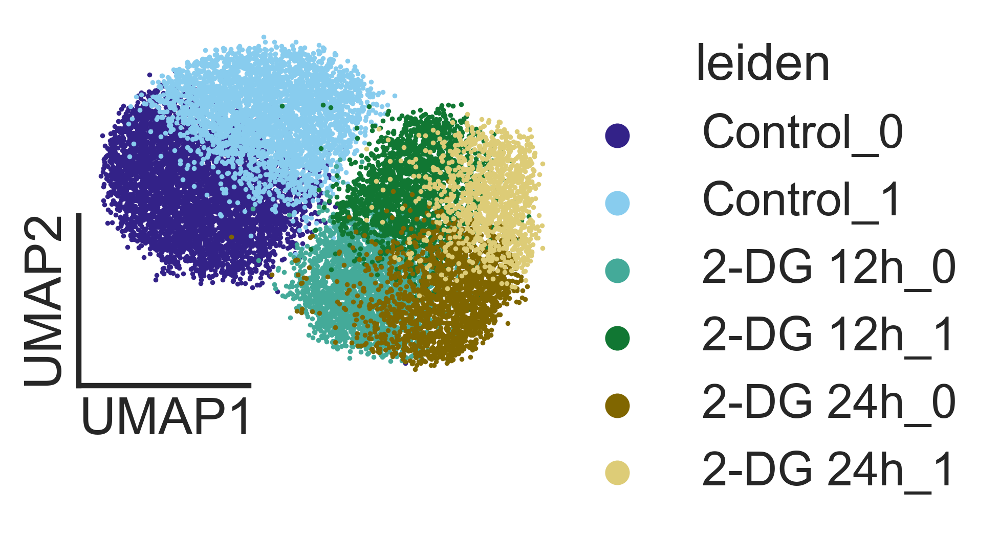

In [50]:
custom_order = ['Control_0','Control_1','2-DG 12h_0','2-DG 12h_1', '2-DG 24h_0','2-DG 24h_1']

adata_combined.obs['leiden'] = adata_combined.obs['leiden'].astype('category')
adata_combined.obs['leiden'] = pd.Categorical(adata_combined.obs['leiden'], 
                                                  categories=custom_order, ordered=True)

f = pl.highlight_scatterplot(
    data=adata_combined,
    obsm_key='X_umap',
    hue='leiden', 
    palette=palette,
    height=3,
    aspect=1.4,
    decorate_titles=False,
    trim_axes=True,
    scatter_kwargs={'s':3})

f.add_legend(markerscale=5)
f.set_titles(col_template='')
plt.xlabel('UMAP1', loc='left', fontsize=18)
plt.ylabel('UMAP2', loc='bottom', fontsize=18)

plt.savefig(plots_path / 'panel_H_UMAP.png', bbox_inches='tight')
plt.savefig(plots_path / 'panel_H_UMAP.svg', bbox_inches='tight')

### Panel I - MA plot

#### Control

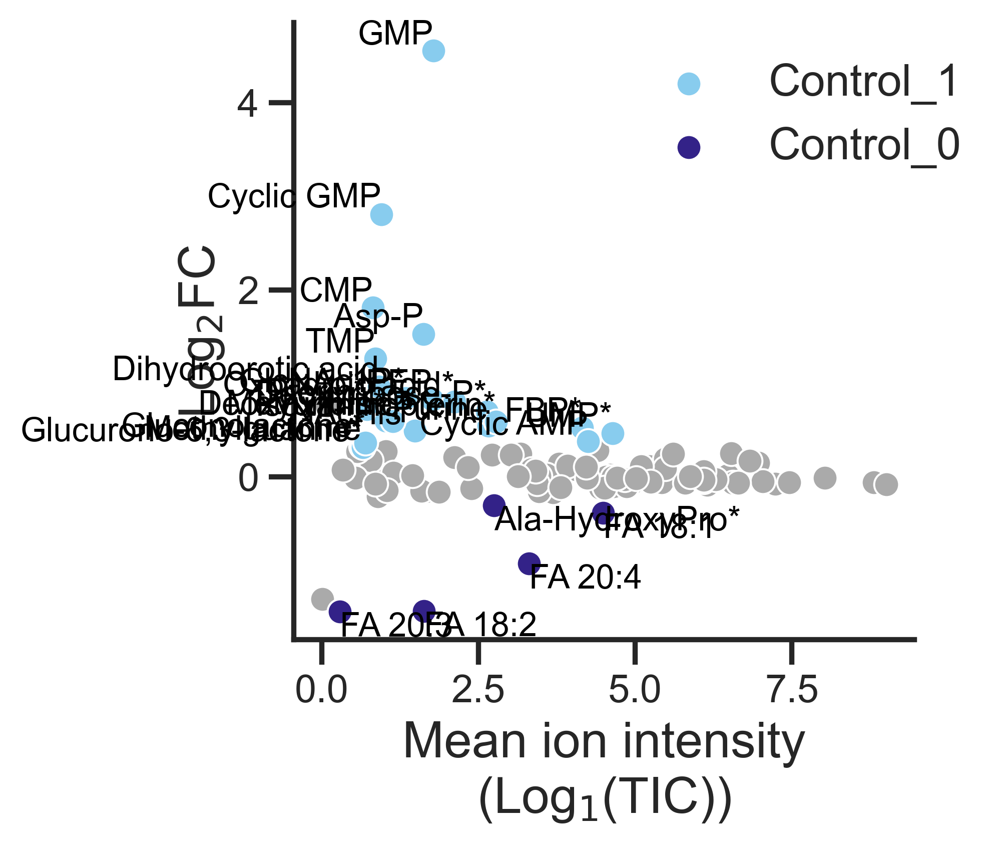

In [51]:
A = (MA_df['Control_1']+MA_df['Control_0'])/2
M = MA_df['Control_1_log2FC']

down = MA_df.loc[(MA_df['Control_1_log2FC']<=-0.3) &
                 (MA_df['Control_1_pvals_adj']<0.05)]

up = MA_df.loc[(MA_df['Control_1_log2FC']>=0.3) &
               (MA_df['Control_1_pvals_adj']<0.05)]

downA = (down['Control_1']+down['Control_0'])/2
downM = down['Control_1_log2FC']
upA = (up['Control_1']+up['Control_0'])/2
upM = up['Control_1_log2FC']

plt.figure(figsize=(4, 4))
sns.scatterplot(data=MA_df, 
                x=A,
                y=M,
                legend=False,
                color=palette[9],
                s=80)
sns.scatterplot(data=up, 
                x=upA,
                y=upM,
                color=palette[1],
                s=80,
                label='Control_1')
sns.scatterplot(data=down, 
                x=downA,
                y=downM,
                color=palette[0],
                s=80,
                label='Control_0')

# Add labels from 'metabolites' column for UP
for i in range(len(up)):
    plt.text(
        x=upA.iloc[i],
        y=upM.iloc[i],
        s=up['metabolites'].iloc[i],
        fontsize=12,
        color='black',
        ha='right',
        va='bottom'
    )

# Add labels from 'metabolites' column for DOWN
for i in range(len(down)):
    plt.text(
        x=downA.iloc[i],
        y=downM.iloc[i],
        s=down['metabolites'].iloc[i],
        fontsize=12,
        color='black',
        ha='left',
        va='top'
    )
    
sns.despine()
plt.legend(bbox_to_anchor=(0.5,1.0), fontsize=16)
plt.xlabel('Mean ion intensity\n(Log$_1$(TIC))', fontsize=18)
plt.ylabel(f'Log$_2$FC', fontsize=18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.savefig(plots_path / 'panel_I_Control.png', bbox_inches='tight')
plt.savefig(plots_path / 'panel_I_Control.svg', bbox_inches='tight')

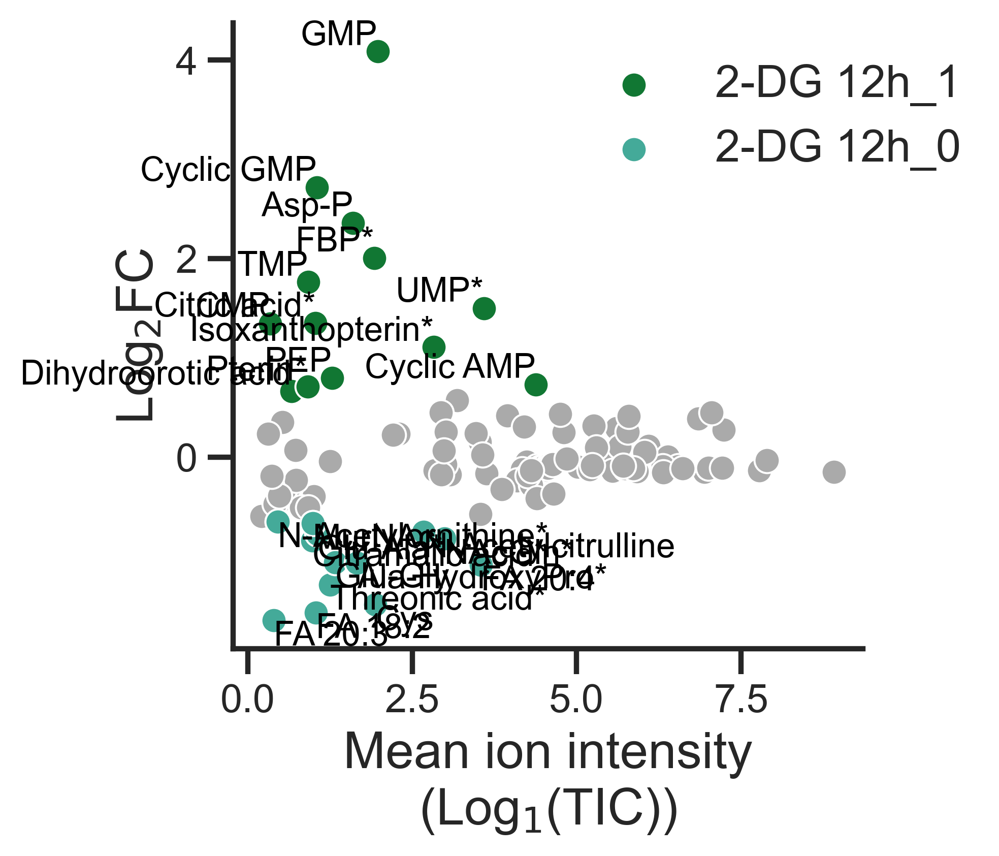

In [52]:
A = (MA_df['2-DG 12h_1']+MA_df['2-DG 12h_0'])/2
M = MA_df['2-DG 12h_1_log2FC']

down = MA_df.loc[(MA_df['2-DG 12h_1_log2FC']<=-0.59) &
                 (MA_df['2-DG 12h_1_pvals_adj']<0.05)]

up = MA_df.loc[(MA_df['2-DG 12h_1_log2FC']>=0.59) &
               (MA_df['2-DG 12h_1_pvals_adj']<0.05)]

downA = (down['2-DG 12h_1']+down['2-DG 12h_0'])/2
downM = down['2-DG 12h_1_log2FC']
upA = (up['2-DG 12h_1']+up['2-DG 12h_0'])/2
upM = up['2-DG 12h_1_log2FC']

plt.figure(figsize=(4, 4))
sns.scatterplot(data=MA_df, 
                x=A,
                y=M,
                legend=False,
                color=palette[9],
                s=80)
sns.scatterplot(data=up, 
                x=upA,
                y=upM,
                color=palette[3],
                s=80,
                label='2-DG 12h_1')
sns.scatterplot(data=down, 
                x=downA,
                y=downM,
                color=palette[2],
                s=80,
                label='2-DG 12h_0')

# Add labels from 'metabolites' column for UP
for i in range(len(up)):
    plt.text(
        x=upA.iloc[i],
        y=upM.iloc[i],
        s=up['metabolites'].iloc[i],
        fontsize=12,
        color='black',
        ha='right',
        va='bottom'
    )

# Add labels from 'metabolites' column for DOWN
for i in range(len(down)):
    plt.text(
        x=downA.iloc[i],
        y=downM.iloc[i],
        s=down['metabolites'].iloc[i],
        fontsize=12,
        color='black',
        ha='left',
        va='top'
    )
    
sns.despine()
plt.legend(bbox_to_anchor=(0.5,1.0), fontsize=16)
plt.xlabel('Mean ion intensity\n(Log$_1$(TIC))', fontsize=18)
plt.ylabel(f'Log$_2$FC', fontsize=18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.savefig(plots_path / 'panel_I_12h.png', bbox_inches='tight')
plt.savefig(plots_path / 'panel_I_12h.svg', bbox_inches='tight')

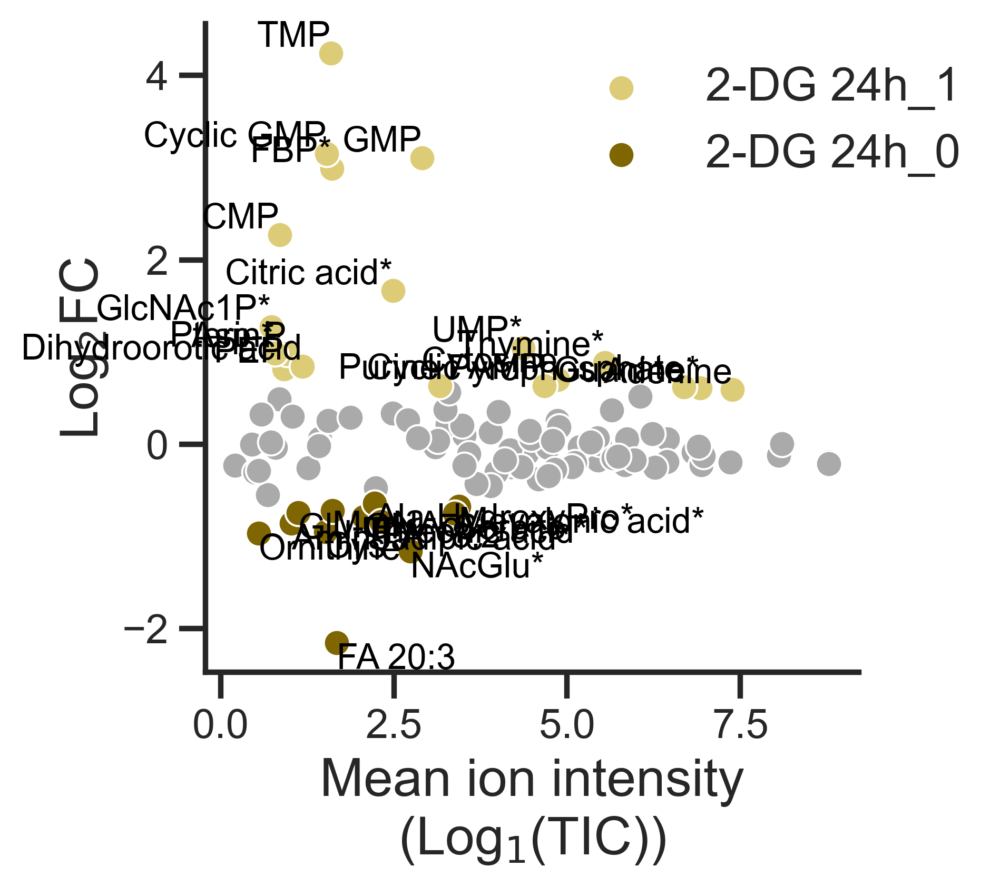

In [53]:
A = (MA_df['2-DG 24h_1']+MA_df['2-DG 24h_0'])/2
M = MA_df['2-DG 24h_1_log2FC']

down = MA_df.loc[(MA_df['2-DG 24h_1_log2FC']<=-0.59) &
                 (MA_df['2-DG 24h_1_pvals_adj']<0.05)]

up = MA_df.loc[(MA_df['2-DG 24h_1_log2FC']>=0.59) &
               (MA_df['2-DG 24h_1_pvals_adj']<0.05)]

downA = (down['2-DG 24h_1']+down['2-DG 24h_0'])/2
downM = down['2-DG 24h_1_log2FC']
upA = (up['2-DG 24h_1']+up['2-DG 24h_0'])/2
upM = up['2-DG 24h_1_log2FC']

plt.figure(figsize=(4, 4))
sns.scatterplot(data=MA_df, 
                x=A,
                y=M,
                legend=False,
                color=palette[9],
                s=80)
sns.scatterplot(data=up, 
                x=upA,
                y=upM,
                color=palette[5],
                s=80,
                label='2-DG 24h_1')
sns.scatterplot(data=down, 
                x=downA,
                y=downM,
                color=palette[4],
                s=80,
                label='2-DG 24h_0')

# Add labels from 'metabolites' column for UP
for i in range(len(up)):
    plt.text(
        x=upA.iloc[i],
        y=upM.iloc[i],
        s=up['metabolites'].iloc[i],
        fontsize=12,
        color='black',
        ha='right',
        va='bottom'
    )

# Add labels from 'metabolites' column for DOWN
for i in range(len(down)):
    plt.text(
        x=downA.iloc[i],
        y=downM.iloc[i],
        s=down['metabolites'].iloc[i],
        fontsize=12,
        color='black',
        ha='left',
        va='top'
    )
    
sns.despine()
plt.legend(bbox_to_anchor=(0.5,1.0), fontsize=16)
plt.xlabel('Mean ion intensity\n(Log$_1$(TIC))', fontsize=18)
plt.ylabel(f'Log$_2$FC', fontsize=18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.savefig(plots_path / 'panel_I_24h.png', bbox_inches='tight')
plt.savefig(plots_path / 'panel_I_24h.svg', bbox_inches='tight')